<a href="https://colab.research.google.com/github/melodiw82/FoodClassification_DL/blob/main/FoodClassification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.applications import MobileNetV2, 
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense
from keras.callbacks import EarlyStopping
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

2025-05-07 18:18:50.502301: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-05-07 18:18:50.502435: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-05-07 18:18:50.653784: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
train_dir = '/kaggle/input/food41/images'

In [3]:
categories = sorted(os.listdir(train_dir))
categories

['apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito',
 'bruschetta',
 'caesar_salad',
 'cannoli',
 'caprese_salad',
 'carrot_cake',
 'ceviche',
 'cheese_plate',
 'cheesecake',
 'chicken_curry',
 'chicken_quesadilla',
 'chicken_wings',
 'chocolate_cake',
 'chocolate_mousse',
 'churros',
 'clam_chowder',
 'club_sandwich',
 'crab_cakes',
 'creme_brulee',
 'croque_madame',
 'cup_cakes',
 'deviled_eggs',
 'donuts',
 'dumplings',
 'edamame',
 'eggs_benedict',
 'escargots',
 'falafel',
 'filet_mignon',
 'fish_and_chips',
 'foie_gras',
 'french_fries',
 'french_onion_soup',
 'french_toast',
 'fried_calamari',
 'fried_rice',
 'frozen_yogurt',
 'garlic_bread',
 'gnocchi',
 'greek_salad',
 'grilled_cheese_sandwich',
 'grilled_salmon',
 'guacamole',
 'gyoza',
 'hamburger',
 'hot_and_sour_soup',
 'hot_dog',
 'huevos_rancheros',
 'hummus',
 'ice_cream',
 'lasagna',
 'lobster_bisque',
 'lobster

In [4]:
df = pd.DataFrame(columns=['image_path', 'label'])
df

,image_path,label


In [5]:
dfs = []

for category in categories:
    category_path = os.path.join(train_dir, category)
    image_data = []
    for image_name in os.listdir(category_path):
        image_path = os.path.join(category_path, image_name)
        image_data.append({'image_path': image_path, 'label': category})
    df_category = pd.DataFrame(image_data)
    dfs.append(df_category)

In [6]:
df = pd.concat(dfs, ignore_index=True)
df

,image_path,label
0,/kaggle/input/food41/images/apple_pie/3127422.jpg,apple_pie
1,/kaggle/input/food41/images/apple_pie/2106005.jpg,apple_pie
2,/kaggle/input/food41/images/apple_pie/1847621.jpg,apple_pie
3,/kaggle/input/food41/images/apple_pie/456190.jpg,apple_pie
4,/kaggle/input/food41/images/apple_pie/1461580.jpg,apple_pie
...,...,...
100995,/kaggle/input/food41/images/waffles/619726.jpg,waffles
100996,/kaggle/input/food41/images/waffles/1048577.jpg,waffles
100997,/kaggle/input/food41/images/waffles/1336006.jpg,waffles
100998,/kaggle/input/food41/images/waffles/322684.jpg,waffles


In [ ]:
plt.figure(figsize=(10, 6))

df['label'].value_counts().plot(kind='bar', color='skyblue')
plt.xlabel('Food Category')
plt.ylabel('Count')
plt.title('Value Counts of Food Categories')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [ ]:
labels = df['label']

In [ ]:
class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(labels), y=labels)

In [ ]:
class_weights_dict = dict(enumerate(class_weights))

In [ ]:
print("Class Weights:", class_weights_dict)

In [ ]:
class_weights

80/20 split

In [15]:
train_df, val_df = train_test_split(df, test_size=0.2, random_state=42)

In [16]:
train_df.shape

(80800, 2)

In [17]:
val_df.shape

(20200, 2)

Data augmentation

In [18]:
augmentation_params = {
    'rotation_range': 20,
    'width_shift_range': 0.1,
    'height_shift_range': 0.1,
    'shear_range': 0.2,
    'zoom_range': 0.1,
    'horizontal_flip': True,
    'fill_mode': 'nearest'
}

In [19]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    **augmentation_params
)

In [20]:
img_size = (224, 224)

In [21]:
batch_size = 32

In [22]:
val_datagen = ImageDataGenerator(
    rescale = 1./255
    )

In [23]:
train_images = train_datagen.flow_from_dataframe(
    train_df,
    x_col='image_path',
    y_col='label',

    target_size=img_size,
    batch_size=batch_size,

    shuffle=True,
    seed=42,
    class_mode='categorical'
)

Found 80800 validated image filenames belonging to 101 classes.


In [24]:
val_images = val_datagen.flow_from_dataframe(
    val_df,
    x_col='image_path',
    y_col='label',

    target_size=img_size,
    batch_size=batch_size,

    shuffle=False,
    seed=42,
    class_mode='categorical'
)

Found 20200 validated image filenames belonging to 101 classes.


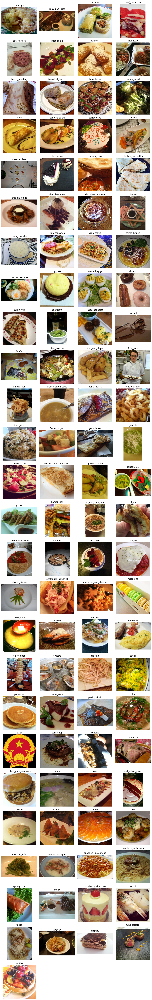

In [25]:
import math

num_categories = len(categories)
cols = 4
rows = math.ceil(num_categories / cols)

fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))
axes = axes.flatten()

for i, category in enumerate(categories):
    category_df = train_df[train_df['label'] == category]
    image_path = category_df.iloc[100]['image_path']
    img = plt.imread(image_path)
    axes[i].imshow(img)
    axes[i].set_title(category)
    axes[i].axis('off')

# Turn off any extra empty subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

Base model - Mobilenetv2

In [27]:
pretrained_model = MobileNetV2(
    input_shape=(img_size[0], img_size[1], 3),
    include_top=False,
    weights='imagenet',
    pooling='avg'
)

pretrained_model.trainable = False

# x = Dense(32, activation='relu')(pretrained_model.output)
# x = Dense(16, activation='relu')(x)
outputs = Dense(len(categories), activation='softmax')(pretrained_model.output)

model_mn = Model(pretrained_model.input, outputs, name='MobileNetV2')

print(model_mn.summary())

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "MobileNetV2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 2,387,365 (9.11 MB)

 Trainable params: 129,381 (505.39 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

None


In [28]:
model_mn.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [29]:
history_mn = model_mn.fit(
    train_images,
    validation_data=val_images,
    epochs=20,
    callbacks=[
        EarlyStopping(
            monitor='val_loss',
            patience=5,
            restore_best_weights=True
        )
    ]
)

Epoch 1/20


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


   1/2525 ━━━━━━━━━━━━━━━━━━━━ 11:12:05 16s/step - accuracy: 0.0000e+00 - loss: 5.0484

I0000 00:00:1746642356.106409      85 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


2525/2525 ━━━━━━━━━━━━━━━━━━━━ 1681s 660ms/step - accuracy: 0.3659 - loss: 2.6764 - val_accuracy: 0.5202 - val_loss: 1.9134
Epoch 2/20
2525/2525 ━━━━━━━━━━━━━━━━━━━━ 1017s 402ms/step - accuracy: 0.5376 - loss: 1.8290 - val_accuracy: 0.5479 - val_loss: 1.8222
Epoch 3/20
2525/2525 ━━━━━━━━━━━━━━━━━━━━ 995s 393ms/step - accuracy: 0.5649 - loss: 1.7062 - val_accuracy: 0.5502 - val_loss: 1.8245
Epoch 4/20
2525/2525 ━━━━━━━━━━━━━━━━━━━━ 1013s 400ms/step - accuracy: 0.5751 - loss: 1.6341 - val_accuracy: 0.5541 - val_loss: 1.8224
Epoch 5/20
2525/2525 ━━━━━━━━━━━━━━━━━━━━ 1002s 396ms/step - accuracy: 0.5918 - loss: 1.5737 - val_accuracy: 0.5490 - val_loss: 1.8585
Epoch 6/20
2525/2525 ━━━━━━━━━━━━━━━━━━━━ 1015s 401ms/step - accuracy: 0.5960 - loss: 1.5571 - val_accuracy: 0.5514 - val_loss: 1.8596
Epoch 7/20
2525/2525 ━━━━━━━━━━━━━━━━━━━━ 999s 395ms/step - accuracy: 0.6020 - loss: 1.5298 - val_accuracy: 0.5503 - val_loss: 1.8665


In [32]:
model_mn.save('/kaggle/working//MobileNet_V2.h5', save_format='h5')

In [33]:
val_loss_mn, val_acc_mn = model_mn.evaluate(val_images, verbose=0)

In [35]:
val_acc_mn

0.5479207634925842

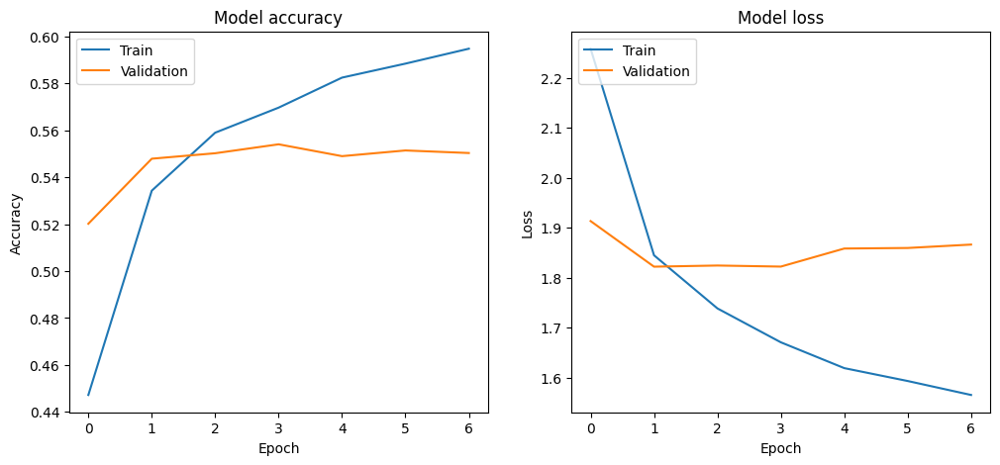

In [36]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history_mn.history['accuracy'])
plt.plot(history_mn.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(1, 2, 2)
plt.plot(history_mn.history['loss'])
plt.plot(history_mn.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.show()

In [37]:
predictions = model_mn.predict(val_images)
predicted_classes = np.argmax(predictions, axis=1)

predicted_classes

632/632 ━━━━━━━━━━━━━━━━━━━━ 61s 92ms/step


array([92, 46, 45, ..., 19, 30, 33])

In [38]:
true_classes = val_images.classes

In [39]:
class_labels = list(val_images.class_indices.keys())

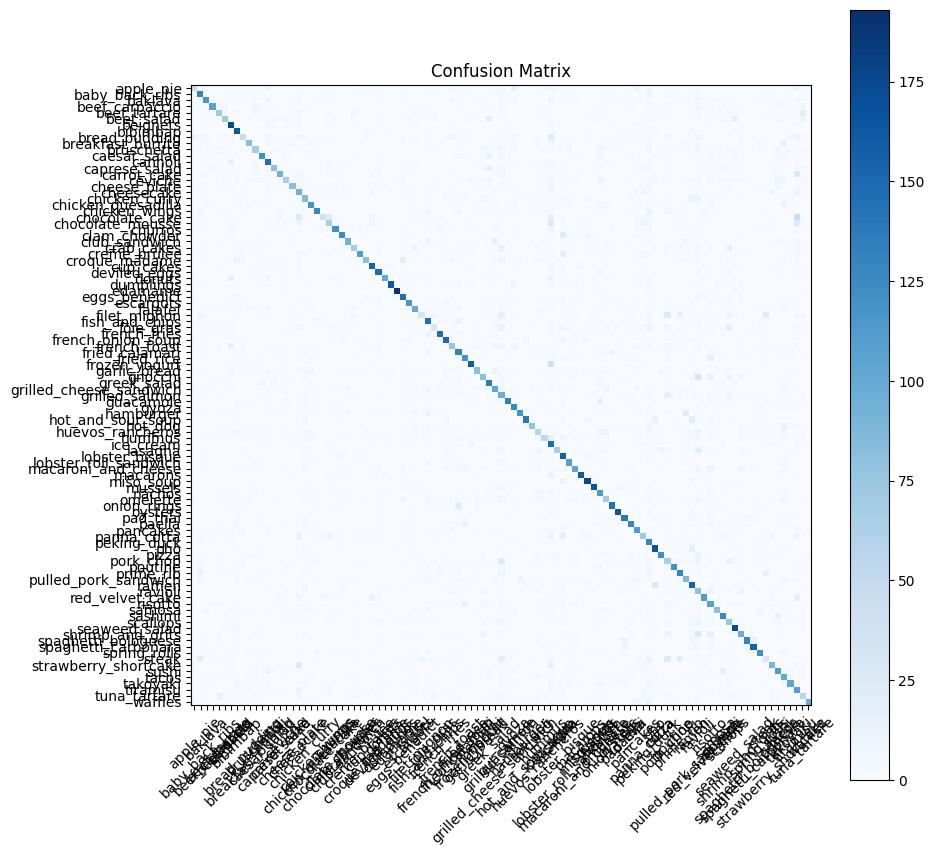

In [40]:
cm = confusion_matrix(true_classes, predicted_classes)

plt.figure(figsize=(10, 10))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(class_labels))
plt.xticks(tick_marks, class_labels, rotation=45)
plt.yticks(tick_marks, class_labels)

plt.show()

In [41]:
report = classification_report(true_classes, predicted_classes, target_names=class_labels)

print(report)

                         precision    recall  f1-score   support

              apple_pie       0.43      0.22      0.29       205
         baby_back_ribs       0.46      0.69      0.55       188
                baklava       0.62      0.55      0.58       212
         beef_carpaccio       0.75      0.53      0.62       201
           beef_tartare       0.49      0.38      0.43       186
             beet_salad       0.51      0.38      0.44       183
               beignets       0.55      0.79      0.65       218
               bibimbap       0.59      0.84      0.69       196
          bread_pudding       0.41      0.21      0.28       217
      breakfast_burrito       0.68      0.42      0.52       194
             bruschetta       0.43      0.36      0.39       194
           caesar_salad       0.64      0.57      0.60       214
                cannoli       0.53      0.69      0.60       214
          caprese_salad       0.72      0.39      0.51       202
            carrot_cake 

testing inference

In [ ]:
import tensorflow as tf
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

model = load_model('./MobileNet_V2.h5')

img_path = './pizza1/download.jpeg'  
img_size = (224, 224)  # Assuming you used 224x224 images during training

img = image.load_img(img_path, target_size=img_size)
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array = preprocess_input(img_array) 

predictions = model.predict(img_array)
predicted_class_idx = np.argmax(predictions, axis=1)[0]

predicted_label = class_indices_new[predicted_class_idx]

print(f"{predicted_label}")

In [ ]:
class_indices